<h1><b><center>Classifier birds</center>
Transfer Learning: 500 Bird Species Classification</h1>
<h3><i><b>Names:</i></b>
<ul>
  <li>Ivan Dávila Puente</li>
  <li>Giovana Guadalupe Rodríguez Donjuan</li>
</ul></h3>


<h3><b><i>Data Preparation</h3>

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"daphish","key":"d9f90ddc017f89ad5819e69d5234430e"}'}

In [2]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d gpiosenka/100-bird-species

Dataset URL: https://www.kaggle.com/datasets/gpiosenka/100-bird-species
License(s): CC0-1.0
100% 1.95G/1.96G [00:30<00:00, 39.7MB/s]
100% 1.96G/1.96G [00:30<00:00, 69.3MB/s]


In [4]:
!unzip 100-bird-species.zip

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: train/WHITE TAILED TROPIC/120.jpg  
  inflating: train/WHITE TAILED TROPIC/121.jpg  
  inflating: train/WHITE TAILED TROPIC/122.jpg  
  inflating: train/WHITE TAILED TROPIC/123.jpg  
  inflating: train/WHITE TAILED TROPIC/124.jpg  
  inflating: train/WHITE TAILED TROPIC/125.jpg  
  inflating: train/WHITE TAILED TROPIC/126.jpg  
  inflating: train/WHITE TAILED TROPIC/127.jpg  
  inflating: train/WHITE TAILED TROPIC/128.jpg  
  inflating: train/WHITE TAILED TROPIC/129.jpg  
  inflating: train/WHITE TAILED TROPIC/130.jpg  
  inflating: train/WHITE TAILED TROPIC/131.jpg  
  inflating: train/WHITE TAILED TROPIC/132.jpg  
  inflating: train/WHITE TAILED TROPIC/133.jpg  
  inflating: train/WHITE TAILED TROPIC/134.jpg  
  inflating: train/WHITE TAILED TROPIC/135.jpg  
  inflating: train/WHITE TAILED TROPIC/136.jpg  
  inflating: train/WHITE TAILED TROPIC/137.jpg  
  inflating: train/WHITE TAILED TROPIC/138.jpg  
  

In [5]:
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [7]:
#Define the parameters

input_shape = (224,224,3)
resnet_weights_path = 'imagenet'
image_size = 224
batch_size = 32

In [8]:
data_generator = ImageDataGenerator(preprocessing_function = preprocess_input)
train_generator = data_generator.flow_from_directory('../content/train',
                                                    target_size = (image_size,image_size),
                                                    batch_size = batch_size,
                                                    shuffle = True,
                                                    class_mode = 'categorical')


val_generator = data_generator.flow_from_directory('../content/valid',
                                                    target_size = (image_size,image_size),
                                                    batch_size = batch_size,
                                                    shuffle = False,
                                                    class_mode = 'categorical')

test_generator = data_generator.flow_from_directory('../content/test',
                                                    target_size = (image_size,image_size),
                                                    batch_size = batch_size,
                                                    shuffle = False,
                                                    class_mode = 'categorical')

Found 84635 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.
Found 2625 images belonging to 525 classes.


In [9]:
# Get the number of classes from the train generator
num_classes = len(train_generator.class_indices)
print(f"Number of classes: {num_classes}")

Number of classes: 525


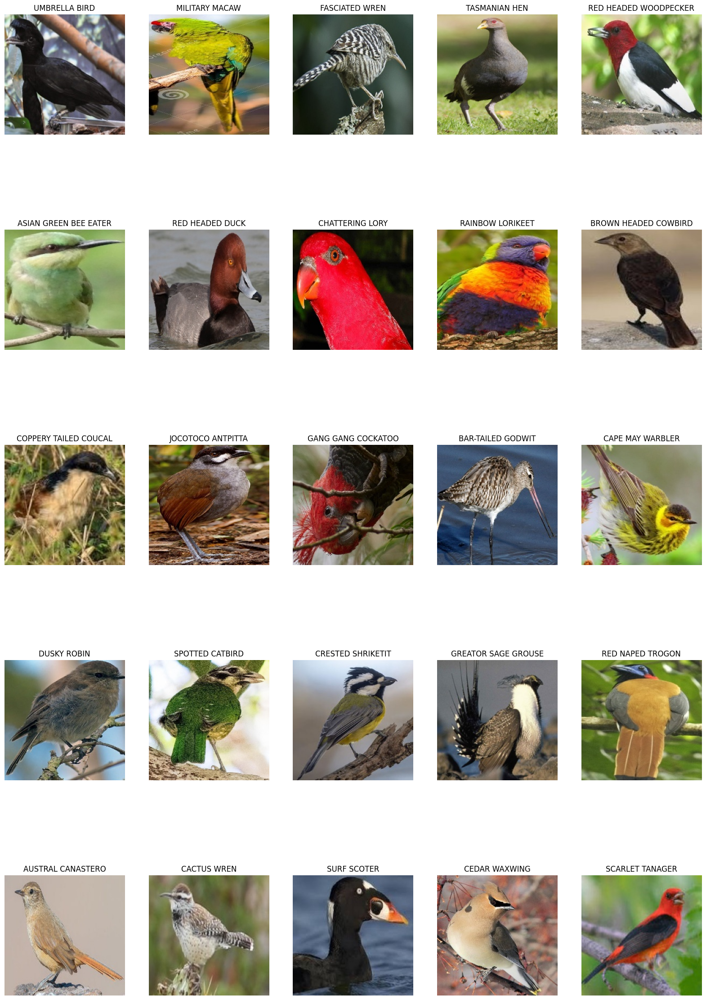

In [10]:
# Display sample images
import random

train_files = train_generator.filepaths
train_labels = train_generator.classes
class_name = list(train_generator.class_indices.keys())

length_images = len(train_labels)
sample_size = min(length_images, 25)
sample_images = random.sample(range(length_images), sample_size)

for i in range(sample_size):
    plt.rcParams['figure.figsize'] = (20, 30)
    img = plt.imread(train_files[sample_images[i]])
    plt.subplot(5, 5, i + 1)
    plt.title(class_name[train_labels[sample_images[i]]])
    plt.imshow(img)
    plt.axis('off')

plt.show()

<h3><b><i>Pre-Trained Model Configuration</h3>

In [11]:
# Build the model
my_new_model = Sequential()
my_new_model.add(ResNet50(include_top=False, pooling='avg', weights=resnet_weights_path))
my_new_model.add(Dense(num_classes, activation='softmax'))
my_new_model.layers[0].trainable = True

94765736/94765736 [==============================] - 1s 0us/step



<h3><b><i>Model Compilation and Training</h3>

In [12]:
# Compile the model
my_new_model.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

In [13]:
# Train the model
my_new_model.fit(train_generator, steps_per_epoch=700, batch_size=batch_size, validation_data=val_generator, epochs=5)


Epoch 1/5
700/700 [==============================] - 280s 368ms/step - loss: 4.0181 - accuracy: 0.3263 - val_loss: 1.5005 - val_accuracy: 0.7059
Epoch 2/5
700/700 [==============================] - 256s 366ms/step - loss: 1.2775 - accuracy: 0.7670 - val_loss: 0.6501 - val_accuracy: 0.8735
Epoch 3/5
700/700 [==============================] - 257s 368ms/step - loss: 0.7148 - accuracy: 0.8599 - val_loss: 0.4038 - val_accuracy: 0.9131
Epoch 4/5
700/700 [==============================] - 256s 366ms/step - loss: 0.5015 - accuracy: 0.9008 - val_loss: 0.3442 - val_accuracy: 0.9185
Epoch 5/5
700/700 [==============================] - 258s 368ms/step - loss: 0.3762 - accuracy: 0.9247 - val_loss: 0.2697 - val_accuracy: 0.9436


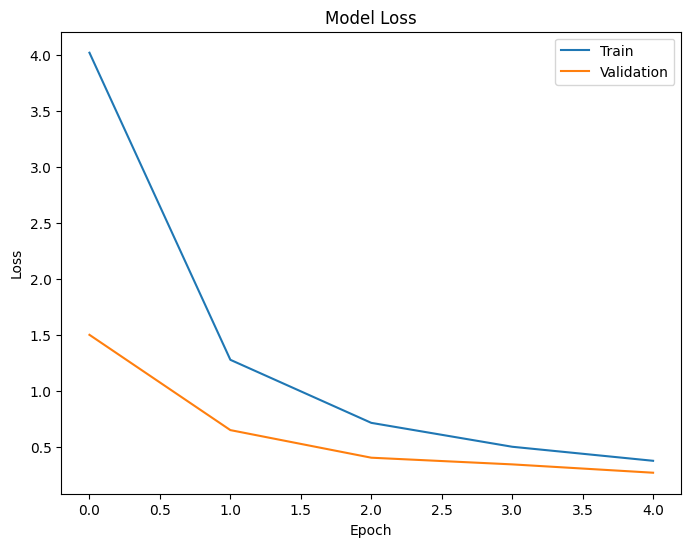

In [14]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
# Plot training loss
plt.plot(my_new_model.history.history['loss'])
plt.plot(my_new_model.history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


<h3><b><i>Model Evaluation</h3>

In [15]:
test_predictions = my_new_model.predict(test_generator)
test_labels = test_generator.classes
test_files = test_generator.filepaths
class_labels = list(test_generator.class_indices.keys())

83/83 [==============================] - 14s 131ms/step


In [16]:
#Accuracy
from sklearn.metrics import accuracy_score
test_acc = accuracy_score(test_labels, np.argmax(test_predictions, axis=1))

print(f'Test accuracy: {test_acc:.2%}')

Test accuracy: 96.23%


In [17]:

from sklearn.metrics import confusion_matrix
import seaborn as sns

# Get predicted labels
test_pred_labels = np.argmax(test_predictions, axis=1)

In [18]:
# Create confusion matrix
confusion_matrix(test_labels, test_pred_labels)

array([[3, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 5, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 5, 0, 0],
       [0, 0, 0, ..., 0, 5, 0],
       [0, 0, 0, ..., 0, 0, 5]])

In [19]:
from sklearn.metrics import confusion_matrix

# Create confusion matrix
cm = confusion_matrix(test_labels, test_pred_labels)

# Select the first 10 classes
num_classes = 10
cm_first_10_classes = cm[:num_classes, :num_classes]

# Print the confusion matrix for the first 10 classes
print(cm_first_10_classes)

[[3 0 0 0 0 0 0 0 0 0]
 [0 4 0 0 0 0 0 0 0 0]
 [0 0 5 0 0 0 0 0 0 0]
 [0 0 0 5 0 0 0 0 0 0]
 [0 0 0 0 5 0 0 0 0 0]
 [0 0 0 0 0 5 0 0 0 0]
 [0 0 0 0 0 0 5 0 0 0]
 [0 0 0 0 0 0 0 5 0 0]
 [0 0 0 0 0 0 0 0 5 0]
 [0 0 0 0 0 0 0 0 0 5]]


In [20]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(test_labels, test_pred_labels, target_names=class_labels)

# Print classification report
print(report)

                               precision    recall  f1-score   support

              ABBOTTS BABBLER       1.00      0.60      0.75         5
                ABBOTTS BOOBY       1.00      0.80      0.89         5
   ABYSSINIAN GROUND HORNBILL       1.00      1.00      1.00         5
        AFRICAN CROWNED CRANE       1.00      1.00      1.00         5
       AFRICAN EMERALD CUCKOO       1.00      1.00      1.00         5
            AFRICAN FIREFINCH       1.00      1.00      1.00         5
       AFRICAN OYSTER CATCHER       1.00      1.00      1.00         5
        AFRICAN PIED HORNBILL       1.00      1.00      1.00         5
          AFRICAN PYGMY GOOSE       1.00      1.00      1.00         5
                    ALBATROSS       1.00      1.00      1.00         5
               ALBERTS TOWHEE       1.00      1.00      1.00         5
         ALEXANDRINE PARAKEET       1.00      1.00      1.00         5
                ALPINE CHOUGH       0.80      0.80      0.80         5
     


<h3><b><i>Prediction and show results</h3>

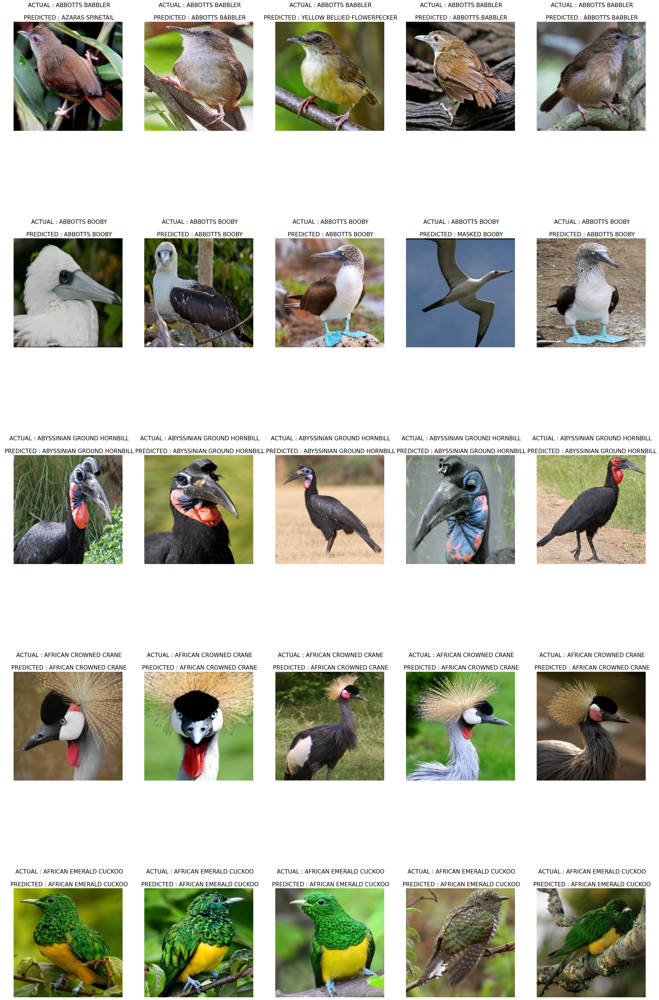

In [27]:
length = len(test_labels)
sample = min(length, 25)

for i in range(sample):
    plt.rcParams['figure.figsize'] = (30, 50)
    img = plt.imread(test_files[i])
    pred_label = np.argmax(test_predictions[i])
    actual_label = test_labels[i]

    plt.subplot(5,5,i+1)
    plt.imshow(img)
    plt.title(f" ACTUAL : {class_labels[actual_label]}\n\n PREDICTED : {class_labels[pred_label]}",fontdict={'fontsize': 15})
    plt.axis('off')

plt.show()